In [65]:
import pandas as pd
import datetime
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.pipeline import Pipeline
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.naive_bayes import BernoulliNB
from sklearn.model_selection import learning_curve, GridSearchCV
import pandas as pd
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import graphviz
import pydot

C:\Users\heath\Anaconda3\lib\site-packages\sklearn\externals\six.py:31: DeprecationWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", DeprecationWarning)


In [57]:
# Print in bold
from IPython.display import display, HTML, Markdown
def printmd(string):
    display(Markdown(string))

In [3]:
processed_data_directory_path = 'C:/Users/heath/Desktop/W207/w207_final_project/w207_final_project/data/processed/'
daily_df = pd.read_csv(processed_data_directory_path + 'daily_data_with_SP500.csv')

In [4]:
daily_df['price_indicator'] = daily_df['pct_change'].apply(lambda c: 1 if c >0 else 0)

In [5]:
daily_df['sp500_indicator'] = daily_df['sp_pct_change'].apply(lambda c: 1 if c >0 else -1)

In [6]:
daily_df

,ticker_symbol,post_date,open_value,high_value,low_value,close_value,volume,reaction_num,compound,writer,body,positive,negative,sp_close,pct_change,sp_pct_change,ratio_pos,ratio_neg,price_indicator,sp500_indicator
0,AAPL,2015-01-05,108.29,108.65,105.4100,106.25,42443391680,661,0.246681,307,661,471,190,2020.58,-2.817159,-1.827811,0.712557,0.287443,0,-1
1,AAPL,2015-01-06,106.54,107.43,104.6300,106.26,44007107500,540,0.260047,289,670,490,180,2002.61,0.009412,-0.889349,0.731343,0.268657,1,-1
2,AAPL,2015-01-07,107.20,108.20,106.6950,107.75,24629743600,476,0.299650,214,616,469,147,2025.90,1.402221,1.162982,0.761364,0.238636,1,1
3,AAPL,2015-01-08,109.23,112.15,108.7000,111.89,46565814120,1025,0.315543,350,787,615,172,2062.14,3.842227,1.788835,0.781449,0.218551,1,1
4,AAPL,2015-01-09,112.67,113.25,110.2100,112.01,30256191720,459,0.245080,243,564,393,171,2044.81,0.107248,-0.840389,0.696809,0.303191,1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7537,TSLA,2019-12-24,418.36,425.47,412.6875,425.25,6532377920,12659,0.230297,502,811,565,246,3223.38,1.438386,-0.019541,0.696671,0.303329,1,-1
7538,TSLA,2019-12-26,427.91,433.48,426.3500,430.94,9476978100,11527,0.194313,503,890,599,291,3239.91,1.338036,0.512816,0.673034,0.326966,1,1
7539,TSLA,2019-12-27,435.00,435.31,426.1100,430.38,7985375254,11119,0.190109,460,802,534,268,3240.02,-0.129948,0.003395,0.665835,0.334165,0,1
7540,TSLA,2019-12-30,428.79,429.00,409.2589,414.70,11530162050,10484,0.147738,500,915,562,353,3221.29,-3.643292,-0.578083,0.614208,0.385792,0,-1


In [7]:
#define columns to keep for model
cols_m = ['volume', 'reaction_num', 'body', 'compound', 'ratio_pos', 'ratio_neg', 'price_indicator', 'sp500_indicator', 
         'high_value', 'low_value', 'open_value']

In [8]:
daily_df = daily_df[cols_m]

In [9]:
daily_df

,volume,reaction_num,body,compound,ratio_pos,ratio_neg,price_indicator,sp500_indicator,high_value,low_value,open_value
0,42443391680,661,661,0.246681,0.712557,0.287443,0,-1,108.65,105.4100,108.29
1,44007107500,540,670,0.260047,0.731343,0.268657,1,-1,107.43,104.6300,106.54
2,24629743600,476,616,0.299650,0.761364,0.238636,1,1,108.20,106.6950,107.20
3,46565814120,1025,787,0.315543,0.781449,0.218551,1,1,112.15,108.7000,109.23
4,30256191720,459,564,0.245080,0.696809,0.303191,1,-1,113.25,110.2100,112.67
...,...,...,...,...,...,...,...,...,...,...,...
7537,6532377920,12659,811,0.230297,0.696671,0.303329,1,-1,425.47,412.6875,418.36
7538,9476978100,11527,890,0.194313,0.673034,0.326966,1,1,433.48,426.3500,427.91
7539,7985375254,11119,802,0.190109,0.665835,0.334165,0,1,435.31,426.1100,435.00
7540,11530162050,10484,915,0.147738,0.614208,0.385792,0,-1,429.00,409.2589,428.79


<b>Shuffle data, Create Test, Dev, and Train Data <b>

In [10]:
df_shuffled = shuffle(daily_df)

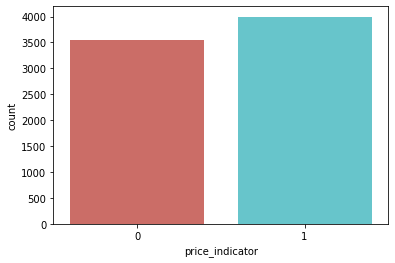

In [13]:
sns.countplot(x=y, data = df_shuffled, palette = 'hls')

<b>Initital Features</b>

In [12]:
x_cols = ['volume', 'body', 'ratio_pos', 'ratio_neg']
X = df_shuffled[x_cols]
y = df_shuffled['price_indicator']

In [14]:
num_train = int(len(df_shuffled)/4)*3
num_test = int(num_train + num_train/2)
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25,random_state=0)
X_train, y_train   = X[num_train:], y[num_train:]
dev_data, dev_labels = X[num_train:num_test], y[num_train:num_test]
X_test, y_test = X[:num_test], y[:num_test]

C:\Users\heath\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\heath\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\heath\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


Accuracy of logistic regression classifier on test set: 0.47
              precision    recall  f1-score   support

           0       0.46      1.00      0.63       874
           1       0.00      0.00      0.00      1013

    accuracy                           0.46      1887
   macro avg       0.23      0.50      0.32      1887
weighted avg       0.21      0.46      0.29      1887

Accuracy: 0.4631690514043455
Precision: 0.0
Recall: 0.0


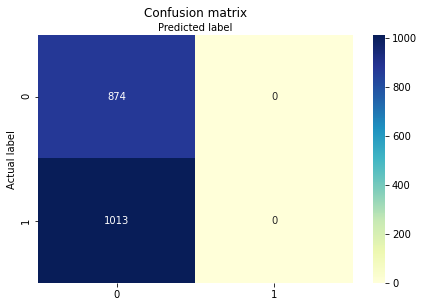

In [15]:
logreg = LogisticRegression()
logreg.fit(X_train, y_train)
y_pred = logreg.predict(dev_data)
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg.score(X_test, y_test)))
cnf_matrix = metrics.confusion_matrix(dev_labels, y_pred)

class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

print(classification_report(dev_labels, y_pred))

print("Accuracy:",metrics.accuracy_score(dev_labels, y_pred))
print("Precision:",metrics.precision_score(dev_labels, y_pred))
print("Recall:",metrics.recall_score(dev_labels, y_pred))

<b> Try again with different features </b>

In [25]:
x_cols = ['reaction_num', 'body', 'ratio_pos', 'ratio_neg']
X = df_shuffled[x_cols]
y = df_shuffled['price_indicator']

In [26]:
len(df_shuffled)

7542

In [27]:
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25,random_state=0)
num_train = int(len(df_shuffled)/4)*3
num_test = int(num_train + num_train/2)
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25,random_state=0)
X_train, y_train   = X[num_train:], y[num_train:]
dev_data, dev_labels = X[num_train:num_test], y[num_train:num_test]
X_test, y_test = X[:num_test], y[:num_test]

<b>Logistic Regression Model </b>

https://towardsdatascience.com/building-a-logistic-regression-in-python-step-by-step-becd4d56c9c8

In [28]:
logreg = LogisticRegression(penalty='l2',C=20.0, solver="liblinear", multi_class="auto")
logreg.fit(X_train, y_train)
y_pred = logreg.predict(dev_data)
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg.score(X_test, y_test)))

Accuracy of logistic regression classifier on test set: 0.57


In [29]:
cnf_matrix = metrics.confusion_matrix(dev_labels, y_pred)
cnf_matrix

array([[326, 548],
       [241, 772]], dtype=int64)

Text(0.5, 257.44, 'Predicted label')

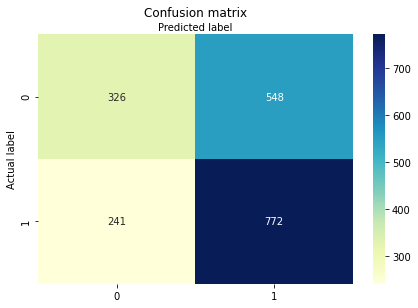

In [30]:
class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

In [31]:
print(classification_report(dev_labels, y_pred))

              precision    recall  f1-score   support

           0       0.57      0.37      0.45       874
           1       0.58      0.76      0.66      1013

    accuracy                           0.58      1887
   macro avg       0.58      0.57      0.56      1887
weighted avg       0.58      0.58      0.56      1887



In [32]:
print("Accuracy:",metrics.accuracy_score(dev_labels, y_pred))
print("Precision:",metrics.precision_score(dev_labels, y_pred))
print("Recall:",metrics.recall_score(dev_labels, y_pred))

Accuracy: 0.5818759936406995
Precision: 0.5848484848484848
Recall: 0.7620927936821322


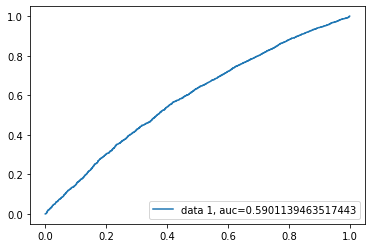

In [33]:
y_pred_proba = logreg.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.show()

In [34]:
C = [0.001, 0.01, 0.1, 0.2, 0.25, 0.5, 0.8, 1, 1.5, 2.0, 5.0, 10.0, 15.0, 20.0, 50]
test_accuracy = np.empty(len(C))
train_accuracy = np.empty(len(C))
for i, c in enumerate(C):
    logreg = LogisticRegression(penalty = 'l2', C=c, solver="liblinear", multi_class="auto")
    logreg.fit(X_train, y_train)
    train_accuracy[i] = logreg.score(X_train, y_train)
    y_pred = logreg.predict(dev_data)
    f1_score = metrics.f1_score(dev_labels, y_pred, average="weighted")
    test_accuracy[i] = f1_score

In [35]:
test_accuracy

array([0.37574462, 0.39878032, 0.49483366, 0.52917049, 0.53360033,
       0.5523554 , 0.55478436, 0.55574745, 0.55554486, 0.55975363,
       0.56208904, 0.56334735, 0.56419661, 0.56484658, 0.56484658])

### Logistic Regression with L2 Regularization

Optimal value for C is 0.50 with a F1 score of 57.76 %

<Figure size 1152x288 with 0 Axes>

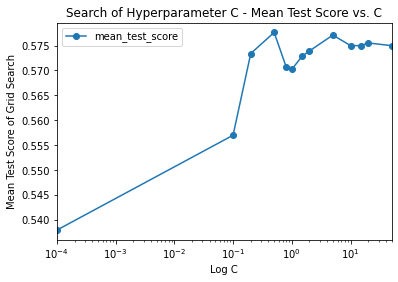

In [36]:
log_reg_clf = Pipeline([
        ('clf', LogisticRegression(penalty='l2',solver="liblinear", multi_class="auto")),
])
C = [0.0001, 0.1, 0.2, 0.5, 0.8, 1, 1.5, 2.0, 5.0, 10.0, 15.0, 20.0, 50]
param_grid = {
    'clf__C': C}
best_log_reg_clf = GridSearchCV(log_reg_clf,param_grid,cv = 5,scoring='f1_micro')
best_log_reg_clf.fit(X_train, y_train)
results = pd.DataFrame(best_log_reg_clf.cv_results_,index = C)
printmd('### Logistic Regression with L2 Regularization')
printmd('Optimal value for C is %.02f with a F1 score of %.02f %%'%(best_log_reg_clf.best_params_['clf__C'],\
                                                             100*best_log_reg_clf.best_score_))
fig = plt.figure(figsize=(16,4))
ax = results.plot('param_clf__C','mean_test_score', linestyle='-', marker='o', logx=True)
ax.set_title("Search of Hyperparameter C - Mean Test Score vs. C")
ax.set_xlabel('Log C')
ax.set_ylabel('Mean Test Score of Grid Search')
plt.show()

In [37]:
def P8(alphas):

### STUDENT START ###
    train_data_2 = np.where(X_train > 0, 1, 0)
    #dev_data_2 = np.where(dev_data > 0, 1, 0)
    printmd('## BernoulliNB Classifier')
    parameters = [alphas]
    gscv = GridSearchCV(BernoulliNB(), parameters)
    gscv.fit(train_data_2, y_train)
    #print("@@Grid Scores@@\n {0}".format(gscv.grid_scores_))
    print("Best Score\n {0}".format(gscv.best_score_))
    print("Best Estimator\n {0}".format(gscv.best_estimator_))
    return gscv

### STUDENT END ###

alphas = {'alpha': [0.0, 0.0001, 0.001, 0.01, 0.1, 0.5, 1.0, 2.0, 10.0]}
nb = P8(alphas)

## BernoulliNB Classifier

Best Score
 0.5368309485956545
Best Estimator
 BernoulliNB(alpha=0.0, binarize=0.0, class_prior=None, fit_prior=True)


C:\Users\heath\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)
C:\Users\heath\Anaconda3\lib\site-packages\sklearn\naive_bayes.py:485: UserWarning: alpha too small will result in numeric errors, setting alpha = 1.0e-10
  'setting alpha = %.1e' % _ALPHA_MIN)
C:\Users\heath\Anaconda3\lib\site-packages\sklearn\naive_bayes.py:485: UserWarning: alpha too small will result in numeric errors, setting alpha = 1.0e-10
  'setting alpha = %.1e' % _ALPHA_MIN)
C:\Users\heath\Anaconda3\lib\site-packages\sklearn\naive_bayes.py:485: UserWarning: alpha too small will result in numeric errors, setting alpha = 1.0e-10
  'setting alpha = %.1e' % _ALPHA_MIN)
C:\Users\heath\Anaconda3\lib\site-packages\sklearn\naive_bayes.py:485: UserWarning: alpha too small will result in numeric errors, setting alpha = 1.0e-10
  'setting

## kNN Neighbors Classifier

Optimal value for k is 200 with a F1 score of 53.52 %

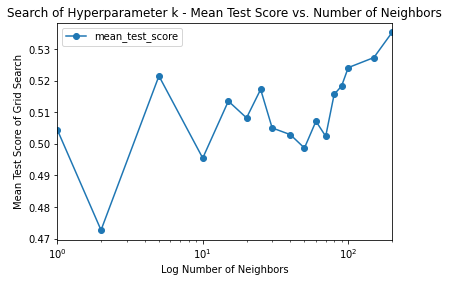

In [38]:
knn_clf = Pipeline([
        ('clf', KNeighborsClassifier()),
])
k = [1,2,5,10,15,20,25,30,40,50,60,70,80,90,100,150,200]
param_grid = {
    'clf__n_neighbors': k}
best_knn_clf = GridSearchCV(knn_clf,param_grid,cv = 5,scoring='f1_micro')
best_knn_clf.fit(X_train, y_train)
results = pd.DataFrame(best_knn_clf.cv_results_,index = k)
printmd('## kNN Neighbors Classifier')
printmd('Optimal value for k is %d with a F1 score of %.02f %%'%(best_knn_clf.best_params_['clf__n_neighbors'],\
                                                             100*best_knn_clf.best_score_))
ax = results.plot('param_clf__n_neighbors','mean_test_score', linestyle='-', marker='o', logx=True)
ax.set_title("Search of Hyperparameter k - Mean Test Score vs. Number of Neighbors")
ax.set_xlabel('Log Number of Neighbors')
ax.set_ylabel('Mean Test Score of Grid Search')
plt.show()

<b>Decision Tree Model </b>

In [39]:
x_cols = ['reaction_num', 'ratio_pos', 'body', 'volume']#, 'open_value', 'high_value', 'low_value'] #'body', 'volume',
X = df_shuffled[x_cols]
y = df_shuffled['price_indicator']

In [40]:
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25,random_state=0)

num_train = int(len(df_shuffled)/4)*3
num_test = int(num_train + num_train/2)
X_train, y_train   = X[num_train:], y[num_train:]
dev_data, dev_labels = X[num_train:num_test], y[num_train:num_test]
X_test, y_test = X[:num_test], y[:num_test]

In [42]:
###### Create Decision Tree classifer object

clf = DecisionTreeClassifier(criterion="entropy", max_depth=95)

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

In [43]:
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.6441262264651286


<b>There is better accuracy on the test set than in the gridsearch of the max depth space.</b>

## Decision Tree

Optimal value for max_depth is 1 with a F1 score of 57.13 %

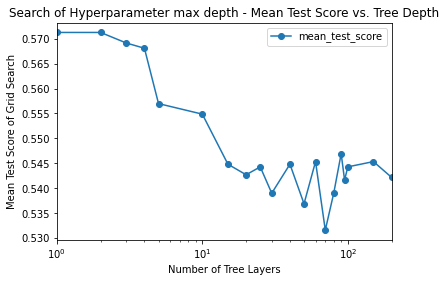

In [51]:
dt_clf = Pipeline([
        ('clf', DecisionTreeClassifier()),
])
layers = [1,2,3,4,5,10,15,20,25,30,40,50,60,70,80,90,95,100,150,200]
param_grid = {
    'clf__max_depth': layers}
best_dt_clf = GridSearchCV(dt_clf,param_grid,cv = 5,scoring='f1_micro')
best_dt_clf.fit(X_train, y_train)
results = pd.DataFrame(best_dt_clf.cv_results_,index = layers)
printmd('## Decision Tree')
printmd('Optimal value for max_depth is %d with a F1 score of %.02f %%'%(best_dt_clf.best_params_['clf__max_depth'],\
                                                             100*best_dt_clf.best_score_))
ax = results.plot('param_clf__max_depth','mean_test_score', linestyle='-', marker='o', logx=True)
ax.set_title("Search of Hyperparameter max depth - Mean Test Score vs. Tree Depth")
ax.set_xlabel('Number of Tree Layers')
ax.set_ylabel('Mean Test Score of Grid Search')
plt.show()

In [292]:
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import graphviz
import pydot

output_name = 'stocks_dt.jpg'
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = x_cols,class_names=['0','1'])
graph = pydot.graph_from_dot_data(dot_data.getvalue())[0]
graph.write_jpg(output_name)
print ('Output:', output_name)
display(Image(filename=output_name))

Output: stocks_dt.jpg


In [62]:
###### Create Decision Tree classifer object
clf = DecisionTreeClassifier(criterion="entropy", max_depth=4)

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

In [63]:
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.5694775921506232


Output: stocks_dt.jpg


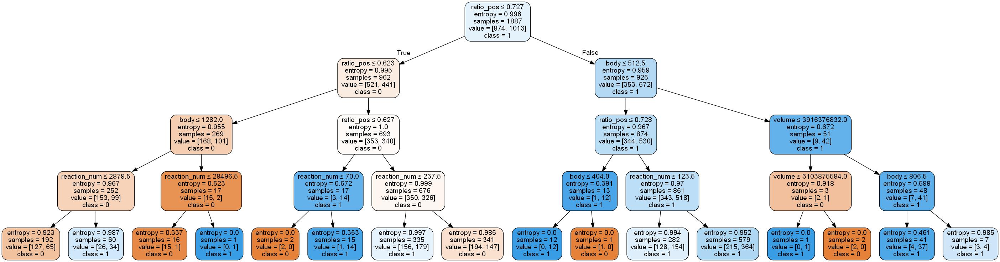

In [66]:
output_name = 'stocks_dt.jpg'
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = x_cols,class_names=['0','1'])
graph = pydot.graph_from_dot_data(dot_data.getvalue())[0]
graph.write_jpg(output_name)
print ('Output:', output_name)
display(Image(filename=output_name))